# Permanent magnet assembly B-field simulation

## Helper functions

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment
"""
Plots flux stream in xz plane along y=0
magnets: collection of magnets used to determine B field
x_grid_bounds: 1x2 list to define x bounds for square grid, grid_bounds[0] is min bound, grid_bounds[1] is max bound
z_grid_bounds: 1x2 list to define z bounds for square grid, grid_bounds[0] is min bound, grid_bounds[1] is max bound

mag_draw_bounds: vertices to define magnet cross section polygon plot
             mag_draw_bounds[i][0] gives list of x-coords of ith polygon vertices
             mag_draw_bounds[i][1] gives list of z-coords of ith polygon vertices
"""
def make_flux_stream(magnets, x_grid_bounds, z_grid_bounds, mag_draw_bounds):
    ts_x = np.linspace(x_grid_bounds[0], x_grid_bounds[1], 100)
    ts_z = np.linspace(z_grid_bounds[0], z_grid_bounds[1], 100)
    grid = np.array([[(x,0,z) for x in ts_x] for z in ts_z])
    
    #get magnetic field
    B = magnets.getB(grid)
    
    #plot flux stream
    fig, ax1 = plt.subplots(1, 1, figsize=(20, 20*np.sum(np.abs(z_grid_bounds)) / np.sum(np.abs(x_grid_bounds))))
    ax1.streamplot(grid[:,:,0], grid[:,:,2], B[:,:,0], B[:,:,2], density=2,
        color=np.log(np.linalg.norm(B, axis=2)), linewidth=1, cmap='autumn', broken_streamlines=False)
    
    #plot coil cross section
    for poly in mag_draw_bounds:
        ax1.plot(poly[0], poly[1],'k--')

"""
Set up axial and transverse sensors and plots the B-field measured
"""
def get_field_on_axes(magnets, axial_sensor_length, transverse_sensor_length, uniformity_bound_t, uniformity_bound_ax):
    # define sensor and axis
    senpos_transverse = np.linspace((-transverse_sensor_length/2, 0, 0), (transverse_sensor_length/2, 0, 0), 5000)
    sen_t = magpy.Sensor(position=senpos_transverse)

    senpos_axial = np.linspace((0, 0, -axial_sensor_length/2), (0, 0, axial_sensor_length/2), 5000)
    sen_ax = magpy.Sensor(position=senpos_axial)
    
    # read from transverse and axial sensors
    Bz_t = sen_t.getB(magnets).T[2]
    Bz_ax = sen_ax.getB(magnets).T[2]

    # convert from returned mT readings to Gauss
    mT_to_G = 10
    Gz_t = Bz_t * mT_to_G
    Gz_ax = Bz_ax * mT_to_G
    
    # plotting
    plt.rc('xtick', labelsize=12) 
    plt.rc('ytick', labelsize=12)
    plt.rcParams.update({'font.size': 12})
    
    fig_width = 10
    fig = plt.figure(figsize=(fig_width, fig_width))
    ax1 = fig.add_subplot(321)
    ax2 = fig.add_subplot(322)
    ax3 = fig.add_subplot(323)
    ax4 = fig.add_subplot(324)
    ax5 = fig.add_subplot(325, projection='3d', elev=24)
    ax6 = fig.add_subplot(326, projection='3d', elev=24)
    ax6.view_init(elev=0, azim=0)
    
    ax1.set_ylabel("Gauss")
    ax1.plot(senpos_transverse[:, 0], Gz_t, ls='--')
    ax1.set_title('Transverse $B_z$ Profile')
    ax1.grid(color='.9', which='major', axis='both', linestyle='-')

    ax2.plot(senpos_axial[:, 2], Gz_ax, ls='--')
    ax2.set_title('Axial $B_z$ Profile')
    ax2.grid(color='.9')
    
    nonun_ax = get_nonuniformity(Gz_ax, "+z")
    nonun_t = get_nonuniformity(Gz_t, "+x")
    
    uniformity_bounds = 2
    
    xt = senpos_transverse[:, 0]
    # Get indices between uniformity bound range
    indices_xt = np.where(np.logical_and(xt>=uniformity_bound_t[0], xt<=uniformity_bound_t[1]))[0]
    clipped_nonun_t = np.abs(np.take(nonun_t, indices_xt))
    min_nonun_t = np.min(clipped_nonun_t)
    max_nonun_t = np.max(clipped_nonun_t)
    print(f"Min transverse nonuniformity: {min_nonun_t}\nMax transverse nonuniformity:{max_nonun_t}")
    
    # Get clipped range for plot
    clipped_xt = np.take(xt, indices_xt)
    # Plot range corresponding to these indices
    ax3.plot(clipped_xt, clipped_nonun_t, ls='--',)
    ax3.grid(color='.9', which='major', axis='both', linestyle='-')
    ax3.set_ylim(min_nonun_t - 1e-7, max_nonun_t + 1e-7)
    ax3.set_title('Transverse $B_z$ Non-uniformity Profile')
    
    
    xa = senpos_axial[:, 2]
    # Get indices between uniformity bound range
    indices_xa = np.where(np.logical_and(xa>=uniformity_bound_ax[0], xa<=uniformity_bound_ax[1]))[0]
    clipped_nonun_ax = np.abs(np.take(nonun_ax, indices_xa))
    min_nonun_ax = np.min(clipped_nonun_ax)
    max_nonun_ax = np.max(clipped_nonun_ax)
    print(f"Min axial nonuniformity: {min_nonun_ax}\nMax axial nonuniformity:{max_nonun_ax}")
    
    # Get clipped range for plot
    clipped_xa = np.take(xa, indices_xa)
    # Plot range corresponding to these indices
    ax4.plot(clipped_xa, clipped_nonun_ax, ls='--',)
    ax4.grid(color='.9', which='major', axis='both', linestyle='-')
    ax4.set_ylim(min_nonun_ax - 1e-7, max_nonun_ax + 1e-7)
    ax4.set_title('Axial $B_z$ Non-uniformity Profile')
    
    magpy.show(magnets, sen_ax, sen_t, canvas=ax5, style_magnetization_show=True)
    magpy.show(magnets, sen_ax, sen_t, canvas=ax6, style_magnetization_show=True)

    plt.tight_layout()
    plt.show()

# return nonuniformity about central point
def get_nonuniformity(G_measured, direction):
    maxG = max(G_measured)
    G_center = G_measured.item(int(len(G_measured)/2))
    
    print(f"Maximum B-field along {direction} direction: {round(maxG, 3)} G")
    print(f"Central B-field along transverse axis: {round(G_center, 3)} G")
    nonuniformity = (G_measured - G_center) / G_center
    return nonuniformity

## Coil 1
2 coil setup intended to match existing python simulation code

- Inner radius = 35.8 mm
- Thickness = 2.4 mm
- Width = 5 mm
- Br = 1.09 T

Maximum B-field along +z direction: 11.971 G
Central B-field along transverse axis: 8.648 G
Maximum B-field along +x direction: 8.648 G
Central B-field along transverse axis: 8.648 G
Min transverse nonuniformity: 0.0
Max transverse nonuniformity:0.00015705616260963494
Min axial nonuniformity: 0.0
Max axial nonuniformity:0.03150945426481322


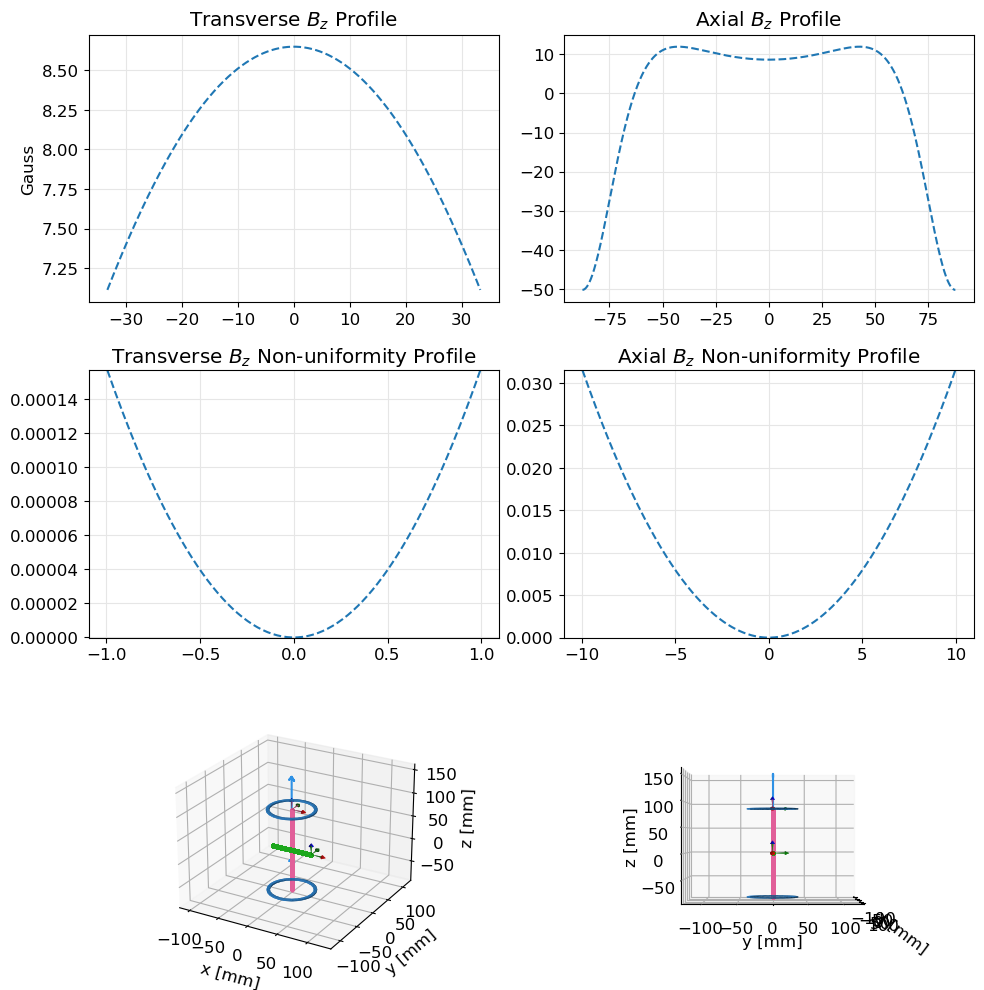

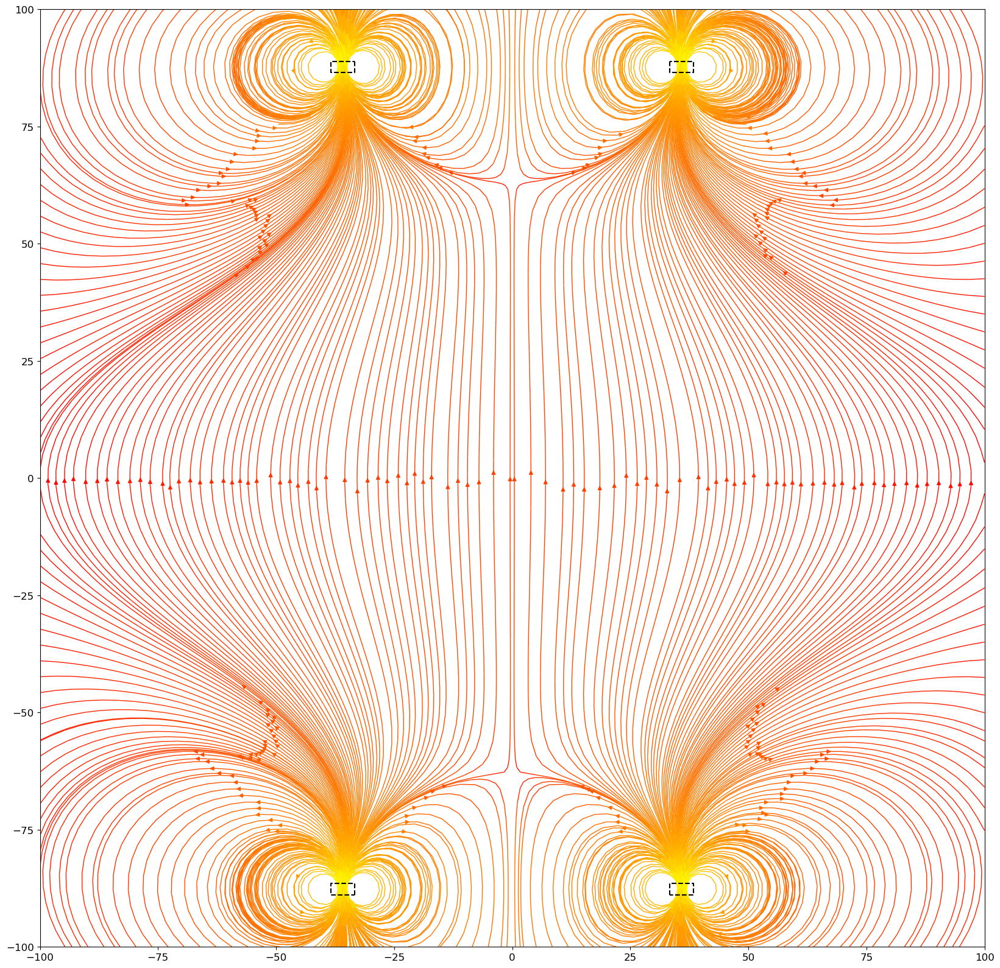

In [46]:
thickness = 2.4
dist = 87.7
innerrad = 33.354
width = 5
Br = 1.09
mT_to_T = 1e3
mT_to_G = 10
Br = Br * mT_to_T

coil1 = magpy.Collection()
ring = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,+dist))
ring2 = CylinderSegment(magnetization=(0,0,Br), dimension=(innerrad, innerrad+width,thickness,0,360), position = (0,0,-dist))
coil1.add(ring).add(ring2)

get_field_on_axes(coil1, dist*2, innerrad*2, [-1,1], [-10,10])

x_bounds = [-100, 100]
z_bounds = [-100, 100]

outerrad = innerrad+width
nearsurface_z = dist - thickness/2
farsurface_z = dist + thickness/2
cross_section_coil1 = np.array([
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]]
])

make_flux_stream(coil1, x_bounds, z_bounds, cross_section_coil1)

## Coil 2
Maxwell 3 coil setup

Maximum B-field along +z direction: 18.825 G
Central B-field along transverse axis: -19.289 G
Maximum B-field along +x direction: -13.196 G
Central B-field along transverse axis: -19.289 G
Min transverse nonuniformity: 0.0
Max transverse nonuniformity:0.001358436181288149
Min axial nonuniformity: 0.0
Max axial nonuniformity:0.2845845100234735


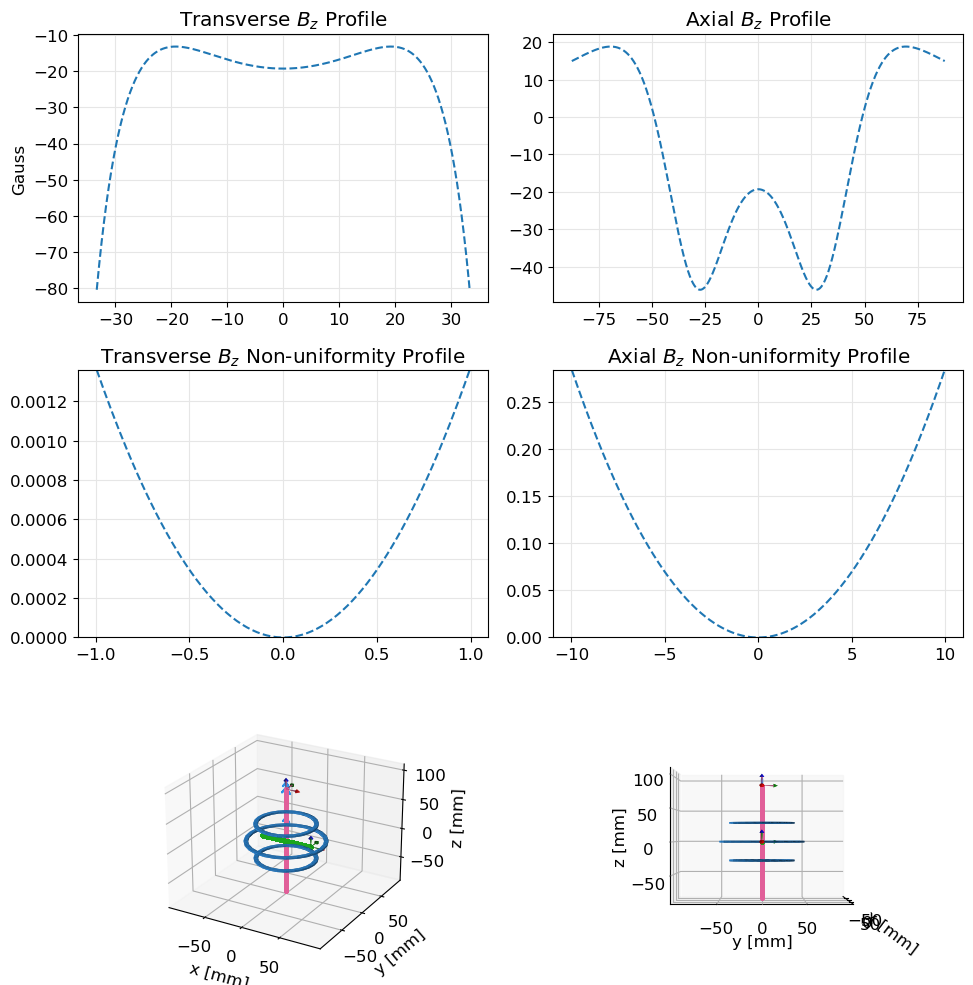

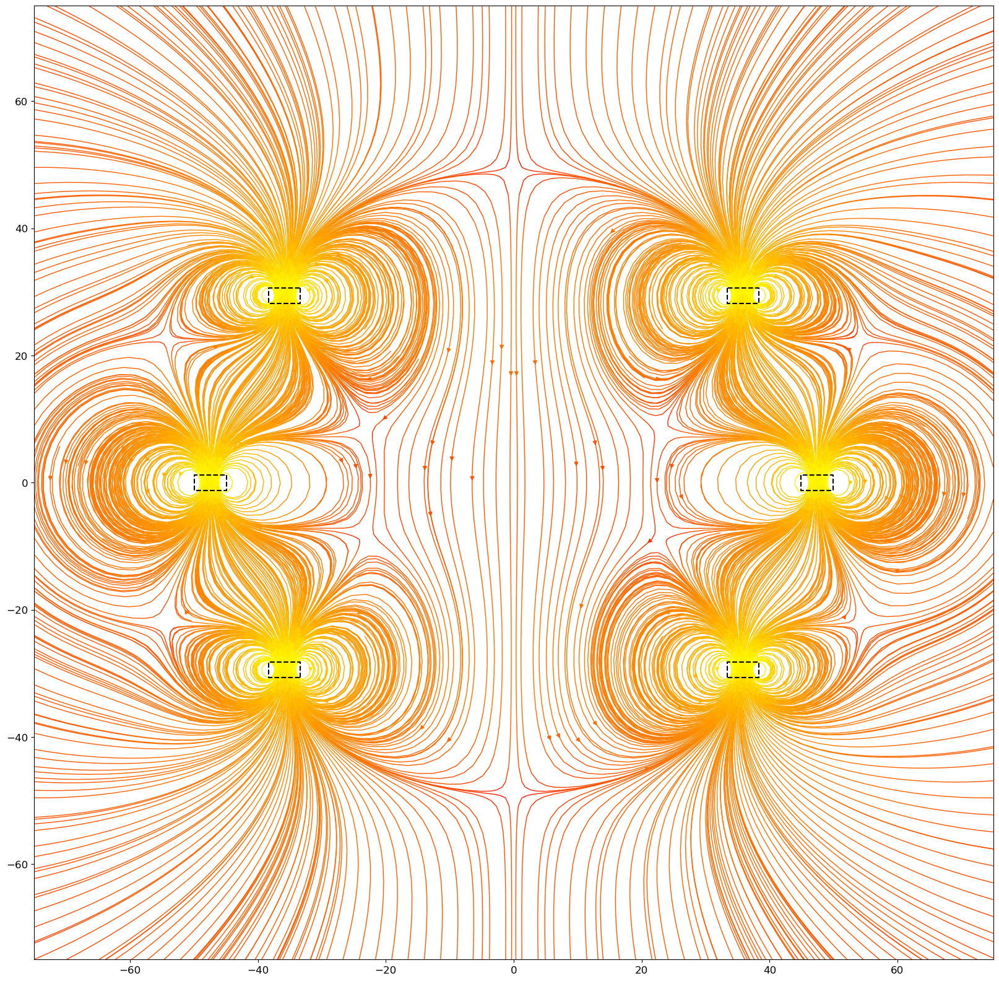

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 2.4
width = 5
innerrad = 33.354
#inner radius of middle coil
innerrad_mid = np.sqrt(7/4) * (innerrad + width/2) - width/2
maxwell_dist = np.sqrt(3/7) * innerrad_mid
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define rings in maxwell coil
maxwell3 = magpy.Collection()
ring_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, +maxwell_dist))
ring_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad_mid, innerrad_mid + width, thickness, 0, 360),
                           position = (0, 0, 0))
ring_mid = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, innerrad + width, thickness, 0, 360),
                           position = (0, 0, -maxwell_dist))
maxwell3.add(ring_top).add(ring_bot).add(ring_mid)

get_field_on_axes(maxwell3, dist*2, innerrad*2, [-1,1], [-10,10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
outerrad = innerrad + width
nearsurface_z = maxwell_dist - thickness/2
farsurface_z = maxwell_dist + thickness/2

outerrad_mid = innerrad_mid + width

cross_section_3_coils = np.array([
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[-innerrad,-innerrad,-outerrad,-outerrad,-innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[innerrad,innerrad,outerrad,outerrad,innerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
    [[-innerrad_mid,-innerrad_mid,-outerrad_mid,-outerrad_mid,-innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
    [[innerrad_mid,innerrad_mid,outerrad_mid,outerrad_mid,innerrad_mid], [thickness/2,-thickness/2,-thickness/2,thickness/2,thickness/2]],
])
make_flux_stream(maxwell3, x_bounds, z_bounds, cross_section_3_coils)

## Stacked disk configuration

Same outer radius R
Separated by R

Maximum B-field along +z direction: 488.047 G
Central B-field along transverse axis: 488.047 G
Maximum B-field along +x direction: 488.048 G
Central B-field along transverse axis: 488.047 G
Min transverse nonuniformity: 0.0
Max transverse nonuniformity:0.00010641101472039922
Min axial nonuniformity: 0.0
Max axial nonuniformity:0.005049887803444442


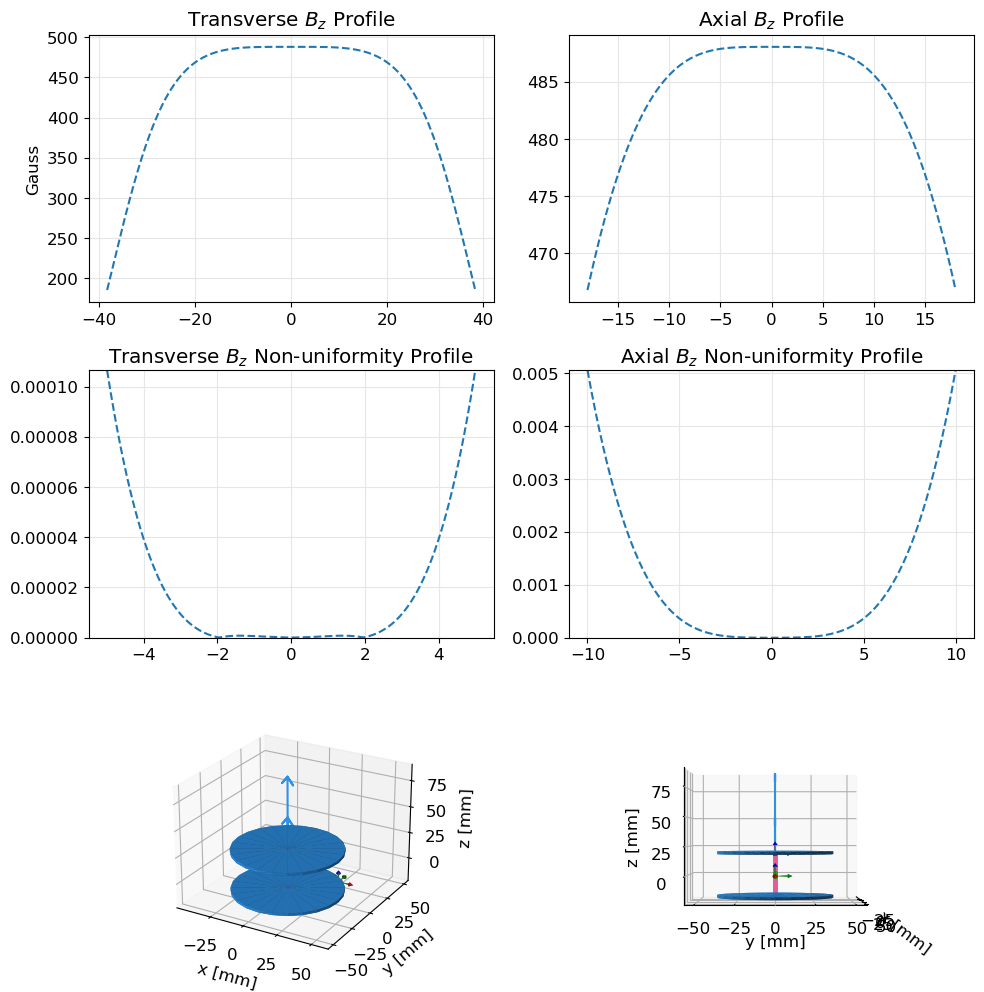

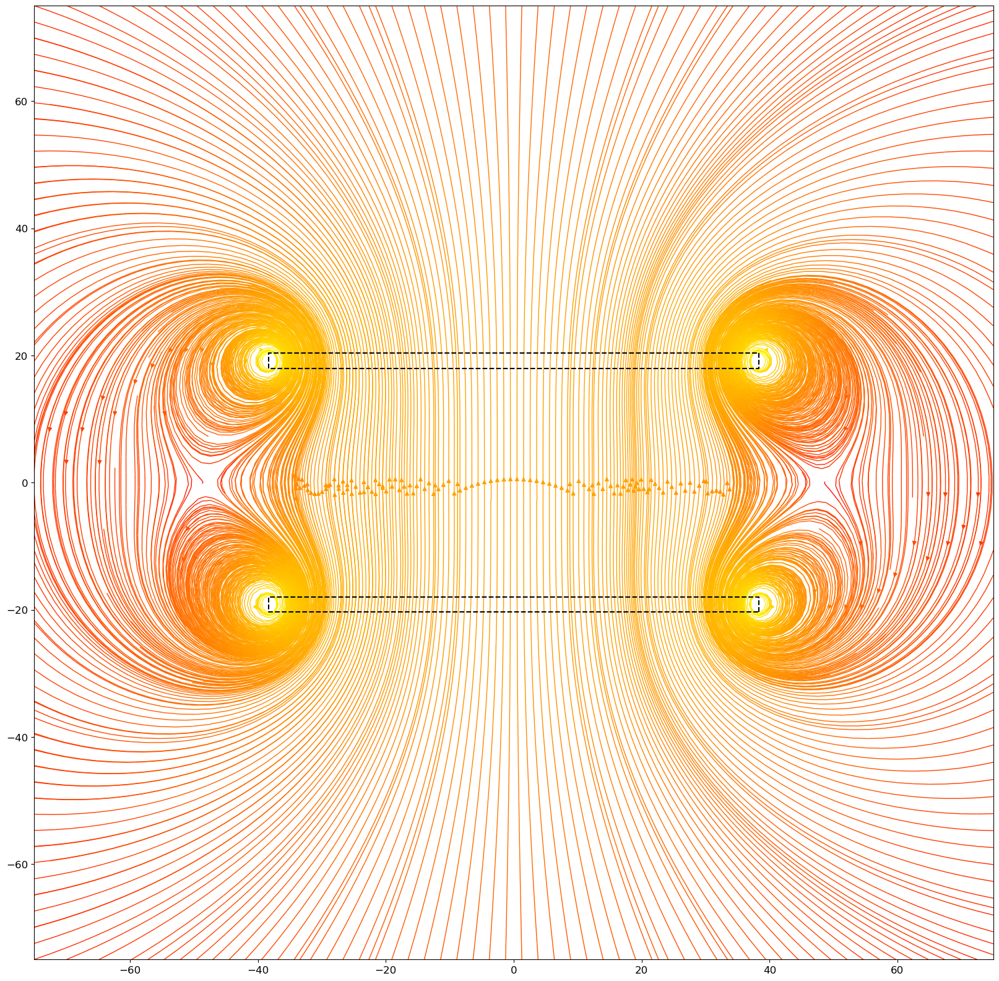

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment


thickness = 2.4
innerrad = 0
outerrad = 38.354
dist = outerrad / 2
Br = 1.09e3 # in mT
mT_to_T = 1e3
mT_to_G = 10

# define permanent magnet assembly
disk2 = magpy.Collection()
disk_top = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, +dist))
disk_bot = CylinderSegment(magnetization=(0, 0, Br),
                           dimension=(innerrad, outerrad, thickness, 0, 360),
                           position = (0, 0, -dist))
disk2.add(disk_top).add(disk_bot)

get_field_on_axes(disk2, 2*(dist-thickness/2), outerrad*2, [-5, 5], [-10, 10])

x_bounds = [-75, 75]
z_bounds = [-75, 75]
nearsurface_z =  dist - thickness/2
farsurface_z = dist + thickness/2

cross_section_disk2 = np.array([
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[outerrad,outerrad,-outerrad,-outerrad,outerrad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(disk2, x_bounds, z_bounds, cross_section_disk2)

## Ruster coil implementations

Composed of individual cylindrical permanent magnets arranged along the circumference of structural coil.

Maximum B-field along +z direction: 3.605 G
Central B-field along transverse axis: 0.548 G
Maximum B-field along +x direction: 0.548 G
Central B-field along transverse axis: 0.548 G
Min transverse nonuniformity: 0.0
Max transverse nonuniformity:0.004058410642588498
Min axial nonuniformity: 0.0
Max axial nonuniformity:0.006038355803919769


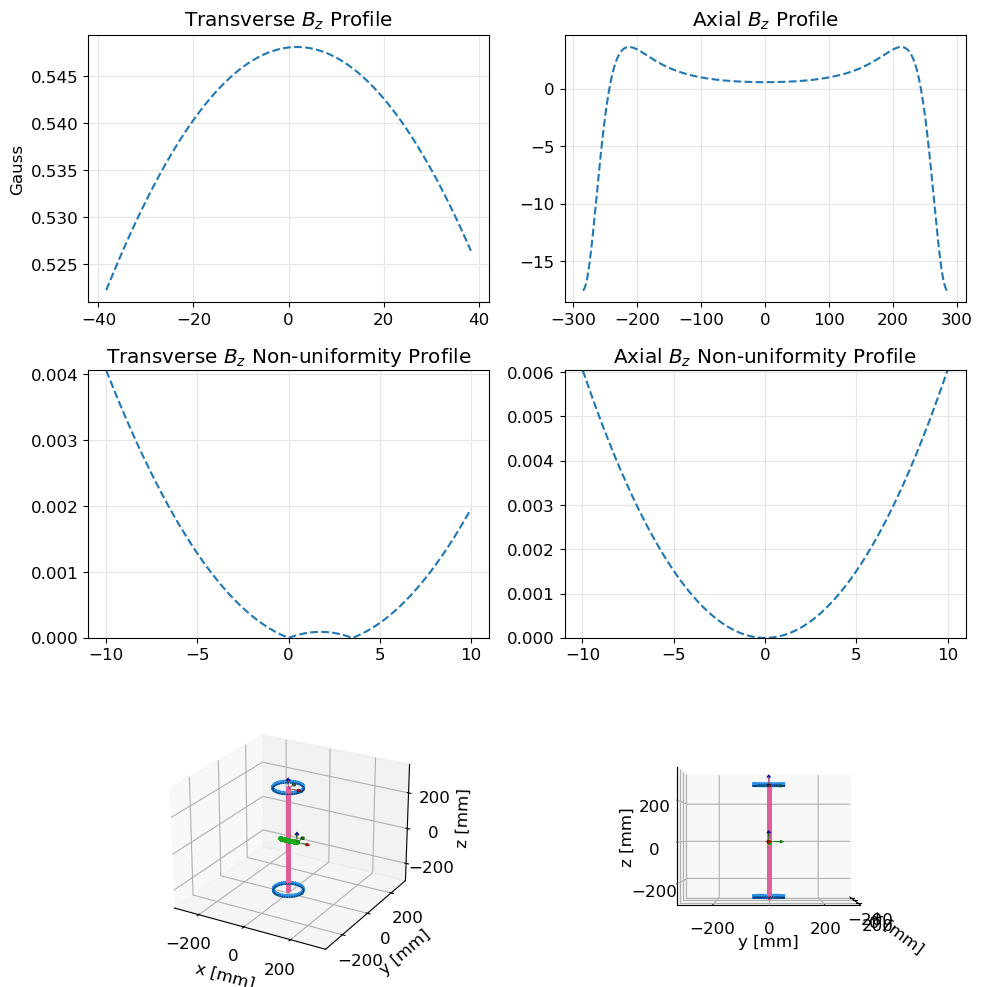

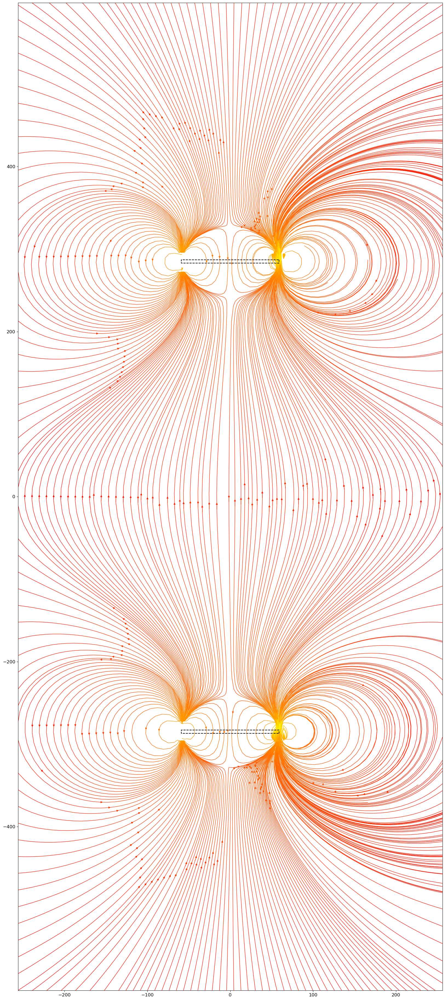

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import magpylib as magpy
from magpylib.magnet import Cuboid, CylinderSegment, Cylinder


# dimensions of each individual cylinder
c_diameter = 6
c_rad = c_diameter/2
c_height = 4
Br = (0, 0, 1.0e3) # in mT

# dimensions of structural coil
st_inner_diameter = 108
st_outer_diameter = 128
st_inner_rad = st_inner_diameter/2
st_outer_rad = st_outer_diameter/2
st_mid_rad = (st_inner_rad + st_outer_rad)/2
magnets_per_coil = 40
# distance from ion
dist = 285


mT_to_T = 1e3
mT_to_G = 10

# define permanent magnet assembly
def arrange_c_magnets(n_magnets, br, c_diameter, c_height, st_inner_diameter, st_outer_diameter, dist, show=False):
    
    c_rad = c_diameter/2
    st_inner_rad = st_inner_diameter/2
    st_outer_rad = st_outer_diameter/2
    # midpoint on width of structural coil 
    st_mid_rad = (st_inner_rad + st_outer_rad)/2
    
    magnets = magpy.Collection()
    theta_range = np.linspace(0, 2*np.pi, n_magnets)
    for theta in theta_range:
        magnets = magnets + Cylinder(magnetization=br,
                                     dimension = (c_diameter, c_height),
                                     position = (st_mid_rad * np.cos(theta), st_mid_rad * np.sin(theta), dist))
    if show:
        magpy.show(magnets, style_magnetization_show=True)
    return magnets
    

mag_top = arrange_c_magnets(magnets_per_coil, Br, c_diameter, c_height, st_inner_diameter, st_outer_diameter, +dist)
mag_bottom = arrange_c_magnets(magnets_per_coil, Br, c_diameter, c_height, st_inner_diameter, st_outer_diameter, -dist)

magnet_assembly = mag_top + mag_bottom
# magpy.show(magnet_assembly, style_magnetization_show=True)

get_field_on_axes(magnet_assembly, 2*(dist), outerrad*2, [-10, 10], [-10, 10])

x_bounds = [-2*st_outer_diameter, 2*st_outer_diameter]
z_bounds = [-2.1*dist, 2.1*dist]
nearsurface_z =  dist - c_height/2
farsurface_z = dist + c_height/2

cross_section_magnets = np.array([
    [[st_mid_rad,st_mid_rad,-st_mid_rad,-st_mid_rad,st_mid_rad], [farsurface_z,nearsurface_z,nearsurface_z,farsurface_z,farsurface_z]],
    [[st_mid_rad,st_mid_rad,-st_mid_rad,-st_mid_rad,st_mid_rad], [-farsurface_z,-nearsurface_z,-nearsurface_z,-farsurface_z,-farsurface_z]],
])
make_flux_stream(magnet_assembly, x_bounds, z_bounds, cross_section_magnets)
